In [1]:
# import packages
%pylab inline

import xarray as xr
import pandas as pd
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
from mpl_toolkits.axes_grid1 import make_axes_locatable
from cartopy.util import add_cyclic_point
import matplotlib.pylab as plt
import matplotlib as mpl
from matplotlib import colorbar, colors
from scipy.stats import poisson
import numpy as np
import random
import regionmask
from scipy.stats import linregress

import sys
wython = '/tigress/wenchang/wython'
if wython not in sys.path: sys.path.append(wython)
from xtc import wherebasin

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


In [2]:
# some configurations on the default figure output
%config InlineBackend.figure_format ='retina'
plt.rcParams['figure.dpi'] = 120

### Function to calculate distances between points

In [3]:
import numpy as np

def haversine(lat1, lon1, lat2, lon2):
    # compute distance between 2 points
    
    R = 6371  # Earth radius in kilometers

    # Convert degrees to radians
    lat1, lon1, lat2, lon2 = map(np.radians, [lat1, lon1, lat2, lon2])

    dlat = lat2 - lat1
    dlon = lon2 - lon1

    a = np.sin(dlat/2)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon/2)**2
    c = 2 * np.arcsin(np.sqrt(a))

    return R * c

# Example
distance_km = haversine(45, 320, 45, 317)
print(distance_km)

235.8665859053396


### Selecting TC basins

Function to only select TCs in a particular basin.
In our case we will use this to specify the Atlantic

In [4]:

from matplotlib import path

def tc_basins(latN=90, latS=-90):
    '''use regionmask to create 8 TC basins'''
    #latN = 90 # north boundary lat
    #latS = -90 # south bounday lat
    name = 'TCBasins'
    names = ['North Atlantic', 'East Pacific', 'West Pacific', 'North Indian',
            'South Indian', 'Australia', 'South Pacific', 'South Atlantic']
    abbrevs = ['NA', 'EP', 'WP', 'NI',
              'SI', 'AU', 'SP', 'SA']
    outlines = [( (295, 0), (260, 20), (260, latN), (360, latN), (360, 0) ),
                ( (200, 0), (200, latN), (260, latN), (260, 20), (295, 0) ),
                ( (105, 0), (105, latN), (200, latN), (200, 0) ),
                ( (30, 0), (30, latN), (105, latN), (105, 0) ),
                ( (30, 0), (30, latS), (105, latS), (105, 0) ),
                ( (105,0), (105, latS), (165, latS), (165, 0) ),
                ( (165, 0), (165, latS), (290, latS), (290, 0) ),
                ( (290, 0), (290, latS), (360, latS), (360, 0) ),
               ]
    numbers = np.arange(len(names))
    # Regions_cls was replaced by Regions since version 0.5.0 of regionmask
    if hasattr(regionmask, 'Regions'):
        Regions = regionmask.Regions
    else:
        Regions = regionmask.Regions_cls
        print('**old versions of regionmask is used: regionmask.Regions_cls**')
    #bs = regionmask.Regions_cls(name=name,
    #bs = regionmask.Regions(name=name,
    bs =             Regions(name=name,
                                numbers=numbers,
                                names=names,
                                abbrevs=abbrevs,
                                outlines=outlines)
    return bs

def tracks_in_basin(ds, basin):
    '''Get the basin bool mask for the tracks dataset.
    **input**:
        ds: tracks dataset;
        basin: basin tag, e.g. "NA" for North Atlantic. 
    **return**:
        in_basin: DataArray of basin mask (bool values)'''
#     ds = xtc.tc_tracks('CTL1860_noleap_tigercpu_intelmpi_18_576PE', years=range(1,11))
#     basin = 'NA'
    # create basin_domain given basin tag, e.g. 'NA' (North Atlantic)
    basins = tc_basins()
    basin_index = basins.map_keys(basin)
    basin_domain = path.Path(basins.coords[basin_index])
    
    # create DataArray of lon/lat pairs
    lon = ds.lon.stack(i_stack=ds.lon.dims)
    lat = ds.lat.stack(i_stack=ds.lat.dims)
    lonlat = xr.concat([lon, lat], dim='lonlat').transpose()
    in_basin = lon.copy().astype('bool') # DataArray to hold the result
    
    # get the basin bool mask for all the tracks
    in_basin.data = basin_domain.contains_points(lonlat)
    in_basin = in_basin.unstack() # unstack to recover the original shape
    
    return in_basin

def wherebasin(da, basin):
    '''mask the input DataArray da by a given basin (e.g. 'NA'). da has lon/lat coordinates'''
    bs = tc_basins()
    return da.where( bs.mask(da) == bs.map_keys(basin) )



### Function to plot TC tracks

Includes windspeed as colors of the lines

In [5]:
import xarray as xr, numpy as np, matplotlib.pyplot as plt
from matplotlib.colors import BoundaryNorm, ListedColormap
from matplotlib.collections import LineCollection
from geoplots import mapplot

def single_track_plot(lonvec, latvec, vmvec, ax=None, lw=1, alpha=1):
    '''plot TC a TC track with varied colors indicating wind spead.'''
    if ax is None:
        ax = plt.gca()
    
    # create segments for the LineCollection
    L = ~np.isnan(lonvec)
    x = lonvec[L]
    y = latvec[L]
    vm = vmvec[L]
    vm = (vm[:-1] + vm[1:])/2.0
    points = np.array([x, y]).T.reshape(-1, 1, 2)
    segments = np.concatenate([points[:-1], points[1:]], axis=1)
    
    # colormap from: 
    # https://upload.wikimedia.org/wikipedia/commons/6/6f/Tropical_cyclones_1945_2006_wikicolor.png
    c = ListedColormap(np.array([(114, 185, 249),
                                (122, 246, 244),
                                (255, 254, 209),
                                (252, 231, 134),
                                (247, 195, 90),
                                (241, 148, 64),
                                (238, 107, 103)])/255.0 )
    levels = [0, 18, 33, 43, 50, 58 , 70, 100]
    norm = BoundaryNorm(levels, c.N)
    
    # LineCollection objects
    lc = LineCollection(segments, cmap=c, norm=norm)
    lc.set_array(vm)
    lc.set_linewidth(lw)
    lc.set_alpha(alpha)

    lines = ax.add_collection(lc)
    ax.autoscale()
    
    return lines

def trackplot(ds, **kwargs):
    '''plot TC a TC track with varied colors indicating wind spead.
    kwargs include: 
        ax(=plt.gca()), 
        lw(=0.5), 
        alpha(=0.5). 
        
    **usage**
        lines = trackplot(ds.isel(year=slice(0,10)), alpha=1)
        plt.colorbar(lines.isel(year=0, storm=0).item())
    '''    
    lines = xr.apply_ufunc(single_track_plot,
                          ds.lon, ds.lat, ds.windmax,
                          input_core_dims=[['stage'], ['stage'], ['stage']],
                          vectorize=True,
                          kwargs=kwargs)
    ax = kwargs.pop('ax', plt.gca())
    ax.autoscale()
    
    return lines

There are some problems for the deprecated basemap package.


### Step 1) Uploading data

1. Getting 2018-2024 TCs from ERA5 tracked data
2. Getting 2018-2024 from IBTrACs dataset: https://www.ncei.noaa.gov/data/international-best-track-archive-for-climate-stewardship-ibtracs/v04r01/access/netcdf/

  

In [16]:
dloc = '/home/el2358/GEOCLIM/el2358/projects/tc_tracker/stitch_data_output'

# ----- ERA5 data ---------


# List of years
years = [2018, 2019, 2020, 2021, 2022, 2023, 2024]

# Open and tag each dataset with its year
datasets = []
for year in years:
    ds = xr.open_dataset("{}/test{}.nc".format(dloc, year)).load()
    ds = ds.expand_dims(year_final=[year])  # Add 'year_final' dimension
    datasets.append(ds)

# Concatenate along the new 'year_final' dimension
era5 = xr.concat(datasets, dim="year_final")
era5_atl = era5.where(tracks_in_basin(era5, 'NA'), drop=True)

# ----- IBTrACS data ---------

dloc = '/home/el2358/GEOCLIM/el2358/projects/tc_tracker/AI_model_test'
ibtracs = xr.open_dataset("{}/IBTrACS.NA.v04r01.nc".format(dloc)).load()

# extract 2005 season
ibtracs_atl = ibtracs.where(
    (ibtracs.time >= np.datetime64('2018-01-01')) & 
    (ibtracs.time <= np.datetime64('2024-12-31')),
    drop=True
)

# ensure longitude coordinates align with the ERA5 data
ibtracs_atl['lon'] = ibtracs_atl['lon'] % 360
ibtracs_atl['lon'] = ibtracs_atl['lon'].where(ibtracs_atl['lon']>190, other=ibtracs_atl['lon']+360)
#ibtracs_2005 = ibtracs_2005.sortby('lon')  # Optional

# unit conversion for consistency with model
ibtracs_atl['wmo_wind'] = ibtracs_atl['wmo_wind'] * 0.514444         # windspeed from kt to m/s
ibtracs_atl['storm_speed'] = ibtracs_atl['storm_speed'] * 0.514444   # translation speed from kt to m/s
ibtracs_atl['wmo_pres'] = ibtracs_atl['wmo_pres'] * 100              # min slp from hPa to Pa

/tmp/ipykernel_182155/2854911565.py:49: FutureWarning: `Regions.coords` has been deprecated in v0.12.0 and will be removed. Please raise an issue if you have an use case for them.
  basin_domain = path.Path(basins.coords[basin_index])


### Step 2) counting the total number of storms in each dataset

Determine the total number of storms detected from 2018-2024 in both the ERA5 dataset and the IBTRACS

In [17]:
# number of storms each dataset detects
print('#TCs 2018-2024 ERA5: {}'.format(era5_atl.lon.isel(stage=0).count('storm').sum('year_final').values))

# count the total number of Atlantic TCs in the Ibtracs dataset throughout a range of years
def storm_count_ibtracs(start_year, stop_year):
    yearly_counts = []
    # loop through each year and add up the total number of storms we observe
    for year in range(start_year, stop_year+1):
        ibtracs_year = ibtracs_atl.where(
        (ibtracs_atl.time >= np.datetime64('{}-01-01'.format(year))) & 
        (ibtracs_atl.time <= np.datetime64('{}-12-31'.format(year))),
        drop=True)
        
        # determining a storm if it has a unique id
        year_count= len(np.unique(ibtracs_year.number.values[~np.isnan(ibtracs_year.number.values)]))
        yearly_counts.append(year_count)
    total = np.sum(yearly_counts)
    return total

total_ibtracs= storm_count_ibtracs(2018, 2024)

print('#TCs 2018-2024 IBTrACS: {}'.format(total_ibtracs))

#TCs 2018-2024 ERA5: 101
#TCs 2018-2024 IBTrACS: 146


Taking a quick look at the ERA5 tracks

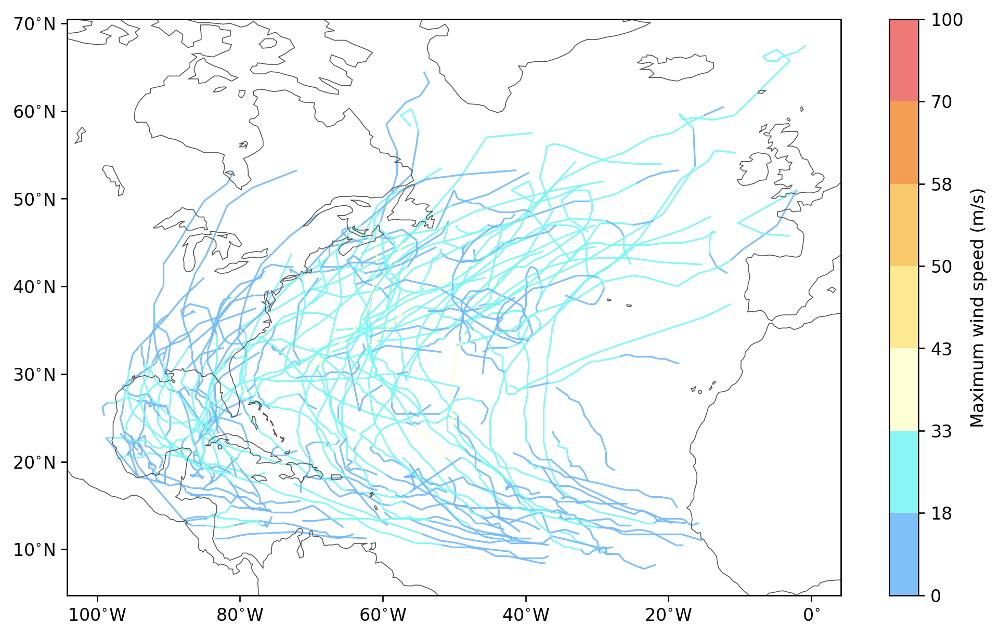

In [9]:
fig, ax = plt.subplots(figsize=(10, 6))

# Plot all storm tracks
lines = trackplot(era5_atl, ax=ax, alpha=0.9, lw=1)  # returns xarray DataArray of LineCollections

# Draw map base layer
mapplot(ax=ax)

# Extract a single LineCollection object (not a NumPy array)
lc = lines.values.flat[0]  # use .flat[0] to get one LineCollection

# Create colorbar
cbar = plt.colorbar(lc, ax=ax, label='Maximum wind speed (m/s)')

plt.show()


### Trying to make similar plot for IBtracs

In [11]:
ibtracs_atl['lon'] = (((ibtracs_atl.lon + 180) % 360) - 180)

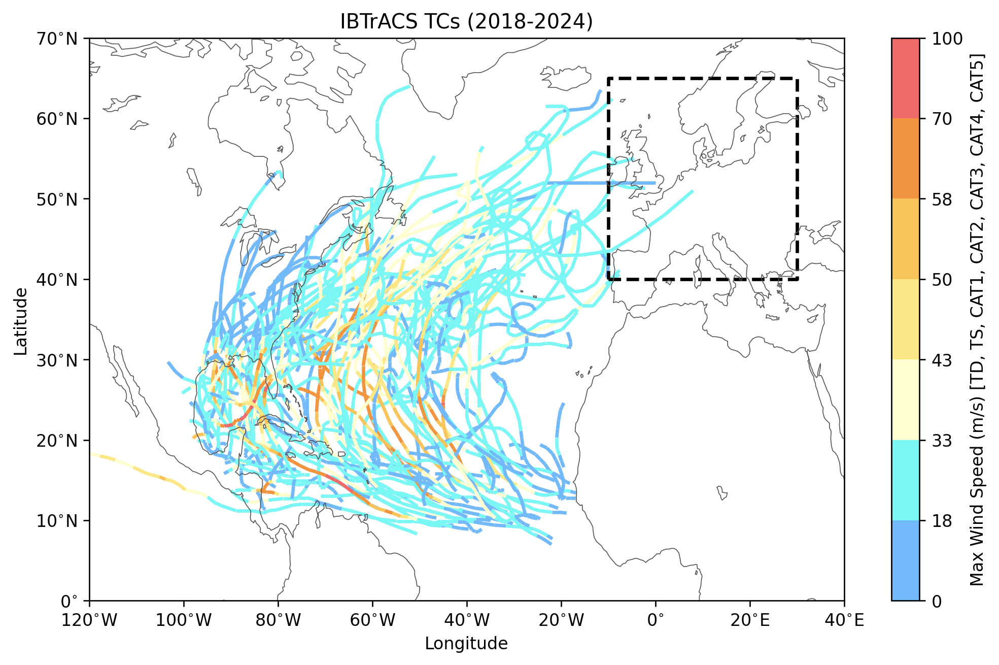

In [12]:
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, BoundaryNorm
from matplotlib.collections import LineCollection
import numpy as np

# Define colormap and levels
cmap = ListedColormap(np.array([
    (114, 185, 249),
    (122, 246, 244),
    (255, 254, 209),
    (252, 231, 134),
    (247, 195, 90),
    (241, 148, 64),
    (238, 107, 103)
]) / 255.0)

levels = [0, 18, 33, 43, 50, 58, 70, 100]
norm = BoundaryNorm(levels, ncolors=cmap.N)

fig, ax = plt.subplots(figsize=(10, 6))

# Loop over each storm
for i in range(ibtracs_atl.sizes['storm']):
    lat = ibtracs_atl.lat.isel(storm=i).values
    lon = ibtracs_atl.lon.isel(storm=i).values
    wind = ibtracs_atl.wmo_wind.isel(storm=i).values

    # Mask invalid (nan) values
    mask = ~np.isnan(lat) & ~np.isnan(lon) & ~np.isnan(wind)
    lat = lat[mask]
    lon = lon[mask]
    wind = wind[mask]

    if len(lat) < 2:
        continue  # Not enough points to form a track

    points = np.array([lon, lat]).T.reshape(-1, 1, 2)
    segments = np.concatenate([points[:-1], points[1:]], axis=1)

    lc = LineCollection(segments, cmap=cmap, norm=norm)
    lc.set_array(wind[:-1])
    lc.set_linewidth(2)
    ax.add_collection(lc)

# Set axis limits based on data
ax.set_xlim(-120, 40) 
ax.set_ylim(0, 70) 
#ax.set_xlim(np.nanmin(ibtracs_atl.lon), np.nanmax(ibtracs_atl.lon))
#ax.set_ylim(np.nanmin(ibtracs_atl.lat), np.nanmax(ibtracs_atl.lat))

# Add colorbar
cbar = plt.colorbar(lc, ax=ax, boundaries=levels, ticks=levels)
cbar.set_label("Max Wind Speed (m/s) [TD, TS, CAT1, CAT2, CAT3, CAT4, CAT5]")

europe_lon = [-10, 30, 30, -10, -10]
europe_lat = [40, 40, 65, 65, 40]
ax.plot(europe_lon, europe_lat, color='black', linestyle='--', linewidth=2, label='Europe Box')


# Optional: add coastlines or map if using mapplot()
mapplot()


ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
ax.set_title("IBTrACS TCs (2018-2024)")
plt.show()


### Step 3) determining where the ERA5 and IBTrACS TC tracks align to compute errors

Next we visually and quantitatively inspect where there false positives (where ERA5 detects a storm while IBTrACs does not) and false negatives occur (where IBTrACS detects a storm while ERA5 does not). We remove all of these, so that we are only comparing storms that both datasets believe to have existed. This is following the convention of Lam et al. 2023 for the analysis of the GraphCast model.

We consider IBTrACS as ground truth here. 

In [51]:
ibtracs_atl

<xarray.Dataset> Size: 24MB
Dimensions:           (storm: 146, date_time: 177, quadrant: 4)
Coordinates:
    time              (storm, date_time) datetime64[ns] 207kB 2018-05-25T12:0...
    lat               (storm, date_time) float32 103kB 18.8 18.7 ... nan nan
    lon               (storm, date_time) float32 103kB 272.9 273.2 ... nan nan
Dimensions without coordinates: storm, date_time, quadrant
Data variables: (12/160)
    numobs            (storm, date_time) float32 103kB 49.0 49.0 ... nan nan
    sid               (storm, date_time) object 207kB b'2018146N19273' ... nan
    season            (storm, date_time) float32 103kB 2.018e+03 ... nan
    number            (storm, date_time) float32 103kB 25.0 25.0 ... nan nan
    basin             (storm, date_time) object 207kB b'NA' b'NA' ... nan nan
    subbasin          (storm, date_time) object 207kB b'CS' b'CS' ... nan nan
    ...                ...
    reunion_gust_per  (storm, date_time) float32 103kB nan nan nan ... nan nan
    usa_seahgt        (storm, date_time) float32 103kB nan nan nan ... nan nan
    usa_searad        (storm, date_time, quadrant) float32 413kB nan nan ... nan
    storm_speed       (storm, date_time) float32 103kB 3.087 3.087 ... nan nan
    storm_dir         (storm, date_time) float32 103kB 105.0 100.0 ... nan nan
    intens_rate       (storm, date_time) float64 207kB nan nan nan ... nan nan
Attributes: (12/49)
    title:                      IBTrACS - International Best Track Archive fo...
    summary:                    The intent of the IBTrACS project is to overc...
    source:                     The original data are tropical cyclone positi...
    Conventions:                ACDD-1.3
    Conventions_note:           Data are nearly CF-1.7 compliant. The sole is...
    product_version:            v04r01
    ...                         ...
    history:                    Tue May  6 06:01:59 2025: ncks --no_abc --cnk...
    license:                    These data may be redistributed and used with...
    featureType:                trajectory
    cdm_data_type:              Trajectory
    comment:                    The tracks of TCs generally look like a traje...
    NCO:                        netCDF Operators version 5.0.7 (Homepage = ht...

/tmp/ipykernel_182155/2854911565.py:49: FutureWarning: `Regions.coords` has been deprecated in v0.12.0 and will be removed. Please raise an issue if you have an use case for them.
  basin_domain = path.Path(basins.coords[basin_index])


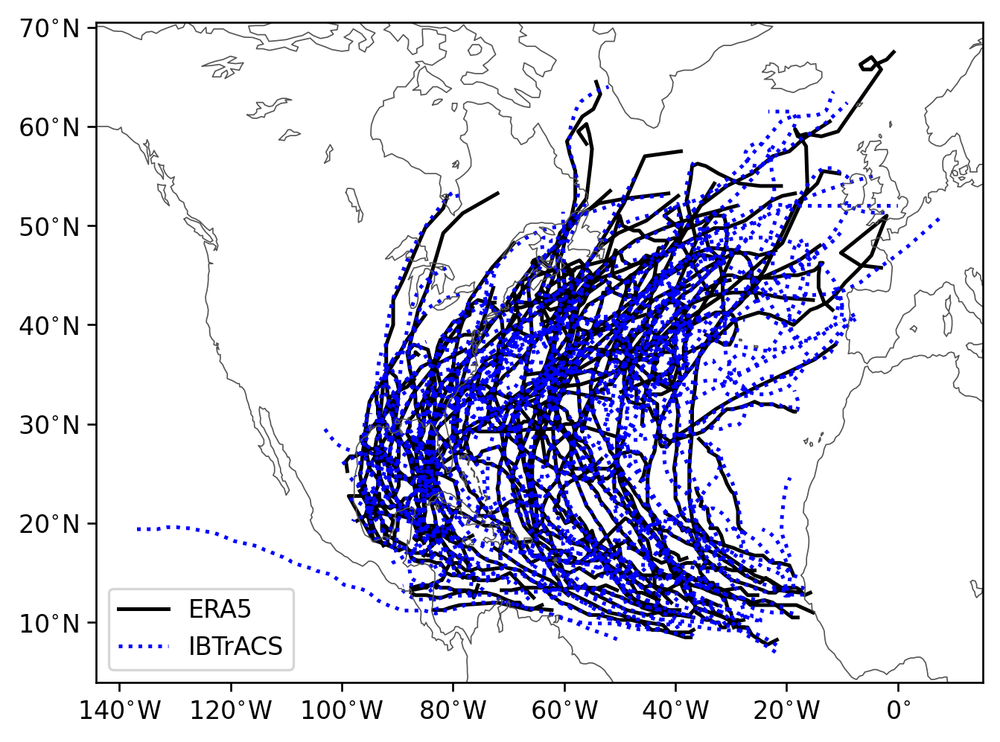

In [18]:
# plot raw tracks from both datasets

plt.plot(era5.where(tracks_in_basin(era5, 'NA')).lon.values.flat, 
         era5.where(tracks_in_basin(era5, 'NA')).lat.values.flat, color='k', label='ERA5')

plt.plot(ibtracs_atl.lon.values.flat,
         ibtracs_atl.lat.values.flat, color='b', linestyle=':', label='IBTrACS')

mapplot()
plt.legend()
plt.show()

### manually compute TC translational speed for the era5 data

Since the Tempest extremes does not explicitly compute it

In [19]:

def compute_translational_speed(ds):
    """
    ds: xarray Dataset with dimensions (year_final, storm, stage)
        and variables 'lat' and 'lon'

    Returns: DataArray of shape (year_final, storm, stage) with translational speed (m/s)
    """
    years = ds.year_final
    storms = ds.storm
    stages = ds.stage

    speed = xr.full_like(ds.lat, fill_value=np.nan)

    for i in range(len(years)):
        for j in range(len(storms)):
            lat = ds.lat.isel(year_final=i, storm=j).values
            lon = ds.lon.isel(year_final=i, storm=j).values

            # Mask valid positions (non-NaN)
            valid = ~np.isnan(lat) & ~np.isnan(lon)

            # If fewer than 2 valid points, skip
            if np.sum(valid) < 2:
                continue

            lat = lat[valid]
            lon = lon[valid]

            # Compute distances and speeds
            dists_km = haversine(lat[:-1], lon[:-1], lat[1:], lon[1:])
            dists_m = dists_km * 1000.0
            speeds = dists_m / 21600.0  # m/s

            # Fill speed array with NaNs except for computed values
            storm_speed = np.full(ds.stage.shape[0], np.nan)
            # Offset indices due to first difference
            valid_indices = np.where(valid)[0]
            storm_speed[valid_indices[1:]] = speeds

            speed[i, j, :] = storm_speed

    return speed.rename("translation_speed")


In [20]:
era5_atl['translation_speed'] = compute_translational_speed(era5_atl)


### Find matching 6 hourly points

Now we want to filter out only the storms where both datasets believe that have existed in some capacity. We will also calculate the false positive and false negative rate to understand where there were discrepencies in the datasets. 

To find storms that align across both datasets we will look timestep by timestep (6 hourly, since this is the resolution of the ERA5 data, whereas IBTRACs is 3 hourly). We will use the lower time resolution (6 hourly) for all timesteps.

For each timestep of the ERA5 data do the following:
Determine how many storms are in the basin at that particular time. 

To do:
1) loop through all values of time in ERA5
2) At each time determine how many TCs are in the basin
3) For each TC draw a 500 km radius around the storm
4) At that time determine if any IBTrACS storm lies within the radius
5) If it does record the lat, lon, windspeed, SLP, other variables for both models and the storm id for both models




In [21]:
def match(model, ibtracs):
    # Stack all 3 dimensions: year_final, storm, and stage
    model_stacked = model.stack(timestep=('year_final', 'storm', 'stage'))
    
    # Build time array from the same full shape
    model_time = pd.to_datetime(dict(
        year=model.year.values.ravel(),
        month=model.month.values.ravel(),
        day=model.day.values.ravel(),
        hour=model.hour.values.ravel()
    ))
    
    # Assign time coordinate
    model_stacked['time'] = (('timestep',), model_time)
    
    # Round time coordinates to the nearest hour (so they are consistent with each other)
    # IBtracs rounds to further decimals than era5
    ibtracs['time'] = ibtracs['time'].dt.round('H')
    model_stacked['time'] = model_stacked['time'].dt.round('H')

        # Get all unique time steps in ERA5
    unique_times = np.unique(model_stacked.time.values)
    
    matches = []
    
    # loop through all time steps 
    for t in unique_times:
        # Get ERA5 storm positions at this time
        model_mask = (model_stacked.time == t) & \
                   (~np.isnan(model_stacked.lat)) & (~np.isnan(model_stacked.lon))
        model_lats = model_stacked.lat.values[model_mask]
        model_lons = model_stacked.lon.values[model_mask]
        model_stormids = model_stacked.storm.values[model_mask]
        model_vmax = model_stacked.windmax.values[model_mask]
        model_slp = model_stacked.slp.values[model_mask]
        model_vtrans = model_stacked.translation_speed.values[model_mask]
    
        # Get IBTrACS storm positions at this time
        ib_mask = (ibtracs.time == t) & \
                  (~np.isnan(ibtracs.lat)) & (~np.isnan(ibtracs.lon))
        ib_lats = ibtracs.lat.values[ib_mask]
        ib_lons = ibtracs.lon.values[ib_mask]
        ib_stormids = ibtracs.number.values[ib_mask]
        ib_vmax = ibtracs.wmo_wind.values[ib_mask]
        ib_slp = ibtracs.wmo_pres.values[ib_mask]
        ib_vtrans = ibtracs.storm_speed.values[ib_mask]
    
        # determine if IBTrACS storms lie within distance threshold of ERA%
        # use distance threshold of 500 km (somewhat arbitrary but 2x max track distance error for GraphCast model)
        for i, (mlat, mlon, mid, mvmax, mslp, mvtrans) in enumerate(zip(model_lats, model_lons, model_stormids, model_vmax, model_slp, model_vtrans)):
            for j, (ilat, ilon, iid, ivmax, islp, ivtrans) in enumerate(zip(ib_lats, ib_lons, ib_stormids, ib_vmax, ib_slp, ib_vtrans)):
                dist_km = haversine(mlat, mlon, ilat, ilon)
                if dist_km <= 500:
                    matches.append({
                        'time': t,
                        'model_lat': mlat,
                        'model_lon': mlon,
                        'ibtracs_lat': ilat,
                        'ibtracs_lon': ilon,
                        'model_stormid': mid,
                        'ibtracs_stormid': iid,
                        'model_vmax': mvmax,
                        'ibtracs_vmax': ivmax,
                        'model_slp': mslp,
                        'ibtracs_slp': islp,
                        'model_vtrans': mvtrans,
                        'ibtracs_vtrans': ivtrans,
                    })

    df = pd.DataFrame(matches)
    # Ensure time is datetime64
    df['time'] = pd.to_datetime(df['time'])

    # Set time as index and convert to xarray
    ds = df.set_index('time').to_xarray()

    return ds

In [22]:
paired_points = match(era5_atl, ibtracs_atl)
distance_error = haversine(paired_points.model_lat, paired_points.model_lon, paired_points.ibtracs_lat, paired_points.ibtracs_lon)
paired_points['loc_error'] = distance_error

/home/GEOCLIM/software/anaconda3/2024.10/envs/geoclim/lib/python3.10/site-packages/xarray/core/accessor_dt.py:163: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  field_values = method(freq=freq).values
/home/GEOCLIM/software/anaconda3/2024.10/envs/geoclim/lib/python3.10/site-packages/xarray/core/accessor_dt.py:163: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  field_values = method(freq=freq).values


In [23]:
paired_points['vtrans_error'] = paired_points['model_vtrans'] - paired_points['ibtracs_vtrans']
paired_points['vmax_error'] = paired_points['model_vmax'] - paired_points['ibtracs_vmax']
paired_points['slp_error'] = paired_points['model_slp'] - paired_points['ibtracs_slp']

### Plotting errors

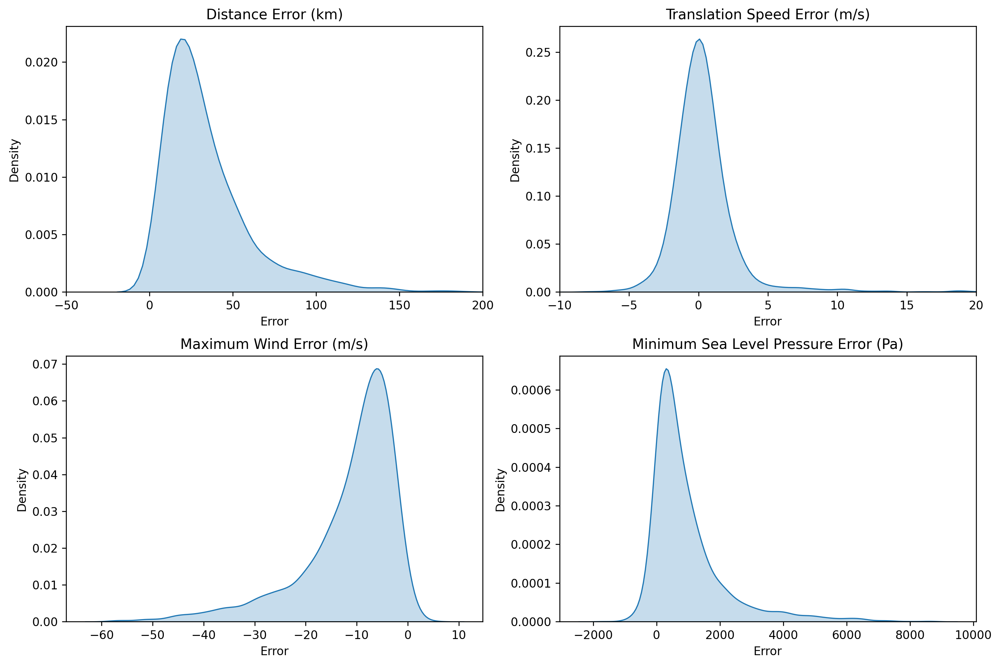

In [24]:
import xarray as xr
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming you have an xarray Dataset with the variables
# loc_error, vtrans_error, vmax_error, slp_error and dimension 'time'

# Extract the variables and drop NaNs
data = {
    'Distance Error (km)': paired_points.loc_error.dropna(dim='time').values,
    'Translation Speed Error (m/s)': paired_points.vtrans_error.dropna(dim='time').values,
    'Maximum Wind Error (m/s)': paired_points.vmax_error.dropna(dim='time').values,
    'Minimum Sea Level Pressure Error (Pa)': paired_points.slp_error.dropna(dim='time').values
}

# Plot setup
fig, axes = plt.subplots(2, 2, figsize=(12, 8))
axes = axes.flatten()

# Iterate and plot KDE for each variable
for ax, (label, values) in zip(axes, data.items()):
    sns.kdeplot(values, ax=ax, fill=True, bw_adjust=1)
    ax.set_title(label)
    ax.set_xlabel("Error")
    ax.set_ylabel("Density")
        # Set x-axis limits for specific plots
    if label == 'Distance Error (km)':
        ax.set_xlim(-50, 200)
    elif label == 'Translation Speed Error (m/s)':
        ax.set_xlim(-10, 20)

plt.tight_layout()
plt.show()


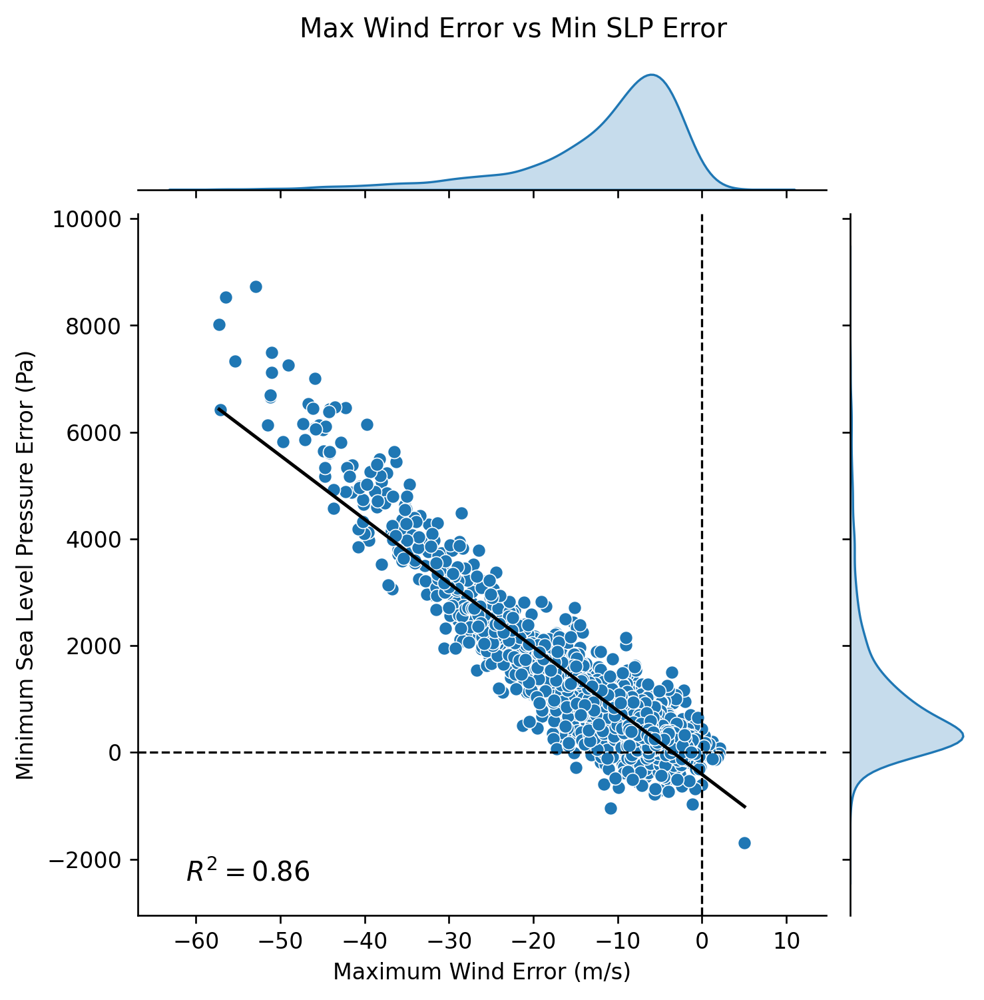

In [25]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from scipy.stats import linregress

# Extract and clean data
vmax_error = paired_points.vmax_error.values
slp_error = paired_points.slp_error.values

# Remove NaNs
mask = ~np.isnan(vmax_error) & ~np.isnan(slp_error)
vmax_error = vmax_error[mask]
slp_error = slp_error[mask]

# Create DataFrame
df = pd.DataFrame({
    'Maximum Wind Error (m/s)': vmax_error,
    'Minimum Sea Level Pressure Error (Pa)': slp_error
})

# Linear regression
slope, intercept, r_value, p_value, std_err = linregress(df['Maximum Wind Error (m/s)'], df['Minimum Sea Level Pressure Error (Pa)'])

# Setup JointGrid
g = sns.JointGrid(data=df, x='Maximum Wind Error (m/s)', y='Minimum Sea Level Pressure Error (Pa)', height=6, space=0.2)

# Scatter
g.plot_joint(sns.scatterplot)

# KDEs
g.plot_marginals(sns.kdeplot, fill=True)

# Regression line
x_vals = np.linspace(df['Maximum Wind Error (m/s)'].min(), df['Maximum Wind Error (m/s)'].max(), 100)
y_vals = intercept + slope * x_vals
g.ax_joint.plot(x_vals, y_vals, 'k-', label='Best Fit')

# Add x=0 and y=0 lines
g.ax_joint.axhline(0, color='black', linestyle='--', linewidth=1)
g.ax_joint.axvline(0, color='black', linestyle='--', linewidth=1)

# R² annotation
r_squared = r_value**2
g.ax_joint.text(0.25, 0.08, f"$R^2 = {r_squared:.2f}$",
                transform=g.ax_joint.transAxes,
                ha='right', va='top', fontsize=12)

plt.suptitle("Max Wind Error vs Min SLP Error", y=1.03)
plt.show()


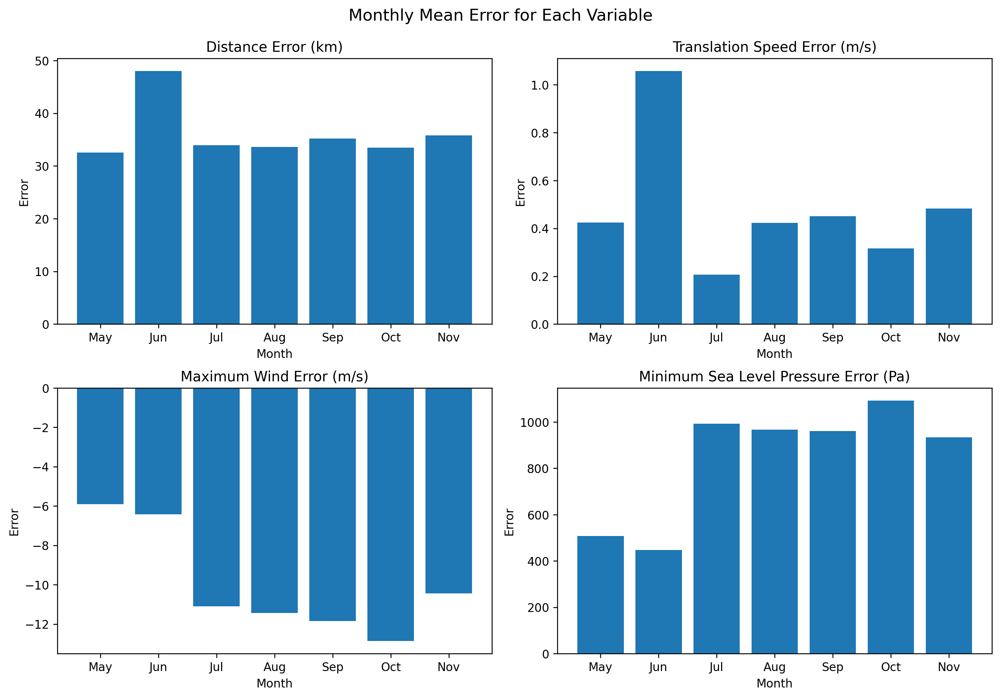

In [26]:
import xarray as xr
import matplotlib.pyplot as plt
import pandas as pd

# Assume your dataset is called ds and has a time dimension
# Extract the month from the time coordinate
ds_monthly = paired_points.assign_coords(month=paired_points['time'].dt.month)

fig, axs = plt.subplots(2, 2, figsize=(12, 8))
axs = axs.flatten()

variables = ['loc_error', 'vtrans_error', 'vmax_error', 'slp_error']
titles = ['Distance Error (km)', 'Translation Speed Error (m/s)', 'Maximum Wind Error (m/s)', 'Minimum Sea Level Pressure Error (Pa)']
month_labels = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun',
                'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

for i, var in enumerate(variables):
    # Group by month and compute mean
    monthly_mean = ds_monthly[var].groupby('month').mean('time')
    
    # Reindex to all 12 months
    monthly_mean = monthly_mean.reindex(month=np.arange(1, 13))
    
    # Plot
    axs[i].bar(month_labels, monthly_mean.values)
    axs[i].set_title(titles[i])
    axs[i].set_ylabel("Error")
    axs[i].set_xlabel("Month")

plt.tight_layout()
plt.suptitle("Monthly Mean Error for Each Variable", y=1.03, fontsize=14)
plt.show()


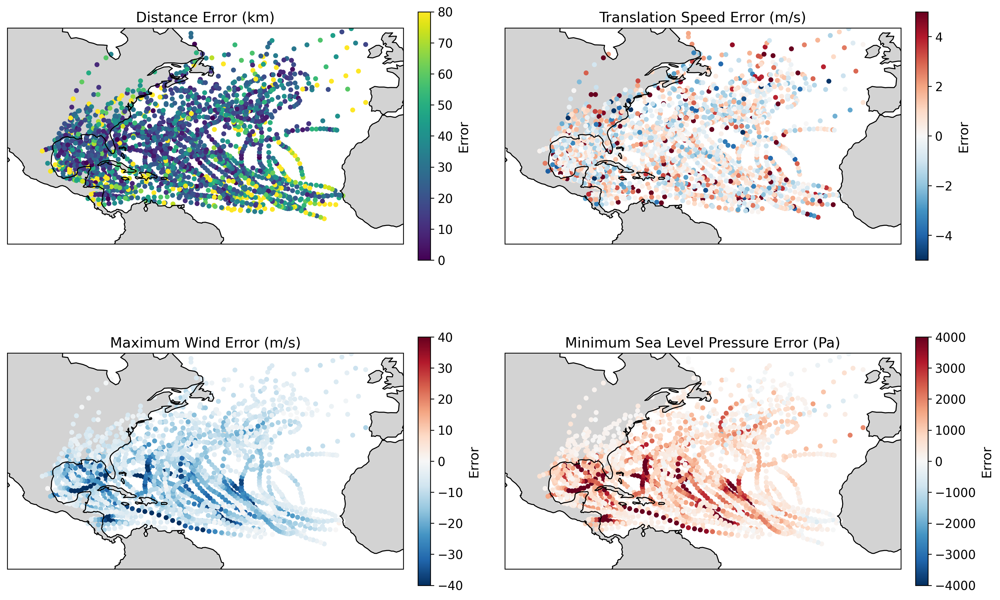

In [27]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Set up parameters for plotting
variables = ['loc_error', 'vtrans_error', 'vmax_error', 'slp_error']
titles = ['Distance Error (km)', 'Translation Speed Error (m/s)',
          'Maximum Wind Error (m/s)', 'Minimum Sea Level Pressure Error (Pa)']
cmaps = ['viridis', 'RdBu_r', 'RdBu_r', 'RdBu_r']
vmins = [0, -5, -40, -4000]
vmaxs = [80, 5, 40, 4000]

# Create figure and subplots
fig, axs = plt.subplots(2, 2, figsize=(14, 10),
                        subplot_kw={'projection': ccrs.PlateCarree()})
axs = axs.flatten()

for i, var in enumerate(variables):
    ax = axs[i]
    
    # Set map extent to the Atlantic basin
    ax.set_extent([-110, 00, 0, 60], crs=ccrs.PlateCarree())
    
    # Add map features
    ax.coastlines()
    #ax.add_feature(cfeature.BORDERS, linewidth=0.5)
    ax.add_feature(cfeature.LAND, facecolor='lightgray')
    ax.add_feature(cfeature.OCEAN, facecolor='white')

    # Scatter plot
    sc = ax.scatter(paired_points['ibtracs_lon'], paired_points['ibtracs_lat'],
                    c=paired_points[var],
                    cmap=cmaps[i], vmin=vmins[i], vmax=vmaxs[i],
                    s=15, transform=ccrs.PlateCarree())

    ax.set_title(titles[i], fontsize=14)

    # Add colorbar
    cbar = fig.colorbar(sc, ax=ax, orientation='vertical', shrink=0.65, pad=0.03)
    cbar.set_label('Error', fontsize=13)
    cbar.ax.tick_params(labelsize=12)

# Layout adjustments
#plt.subplots_adjust(top=0.52)
#plt.suptitle("Atlantic TC Position Colored by Forecast Errors", fontsize=16, y=1.04)
plt.tight_layout()
plt.show()


In [28]:
from sklearn.linear_model import LogisticRegression
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

import regionmask

# Access the Natural Earth land mask at 1:110m resolution
land_mask = regionmask.defined_regions.natural_earth_v5_0_0.land_110

# Compute the mask (True for land, NaN for ocean)
mask = land_mask.mask(paired_points['ibtracs_lon'], paired_points['ibtracs_lat'])

# Convert to binary: 1 for land, 0 for ocean
on_land = (~np.isnan(mask)).astype(int)

#  Assign using .data or .values to avoid ambiguity
paired_points = paired_points.assign_coords(on_land=("time", on_land.data))

Distance Error (km)
Translation Speed Error (m/s)
Max Wind Error (m/s)
Pressure Error (Pa)


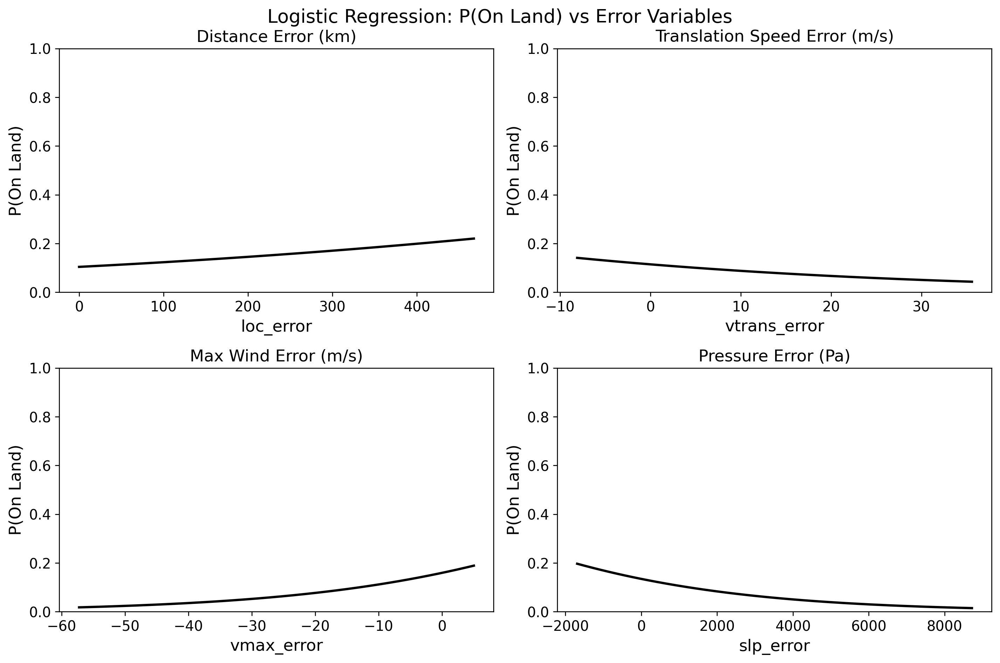

In [29]:
fig, axs = plt.subplots(2, 2, figsize=(12, 8))
error_vars = ['loc_error', 'vtrans_error', 'vmax_error', 'slp_error']
titles = ['Distance Error (km)', 'Translation Speed Error (m/s)', 'Max Wind Error (m/s)', 'Pressure Error (Pa)']

for ax, var, title in zip(axs.flat, error_vars, titles):
    X = paired_points[var].values.reshape(-1, 1)
    y = paired_points['on_land'].values
    
    # Remove NaNs
    mask = ~np.isnan(X[:, 0])
    X = X[mask]
    y = y[mask]
    
    # Fit logistic regression
    model = LogisticRegression()
    model.fit(X, y)
    
    # Plot
    x_vals = np.linspace(X.min(), X.max(), 200).reshape(-1, 1)
    y_prob = model.predict_proba(x_vals)[:, 1]
    ax.plot(x_vals, y_prob, color='black', lw=2)
    
    # Scatter original points (with jitter)
    #sns.stripplot(x=X[:, 0], y=y + np.random.uniform(-0.02, 0.02, size=len(y)),
                 # alpha=0.3, ax=ax, jitter=0.1, color='gray', size=2)
    
    ax.set_title(title, fontsize=14)
    ax.tick_params(axis='both', labelsize=12)
    ax.set_xlabel(f'{var}', fontsize=14)
    ax.set_ylabel('P(On Land)', fontsize=14)
    ax.set_ylim(0, 1) 
    print(title)

plt.suptitle('Logistic Regression: P(On Land) vs Error Variables', fontsize=16)
plt.tight_layout()
plt.subplots_adjust(top=0.92)
plt.show()

### VARIABLE HAS WEAK PREDICTIVE POWER

### Rapid intensification

In [30]:

# compute the maximum intensification in a 24 hour window (in ERA5)

def max_24h_intensification(wind_series):
    """Compute max intensification (current - any of last 3 stages, only if positive)."""
    result = np.full(wind_series.shape, np.nan)
    for i in range(3, len(wind_series)):
        current = wind_series[i]
        prev = wind_series[i-3:i]
        diffs = current - prev
        diffs = diffs[diffs > 0]  # only keep positive diffs
        if len(diffs) > 0:
            result[i] = np.max(diffs)
    return result

# Apply the function over each storm
max_intens = xr.apply_ufunc(
    max_24h_intensification,
    era5_atl.windmax,
    input_core_dims=[['stage']],
    output_core_dims=[['stage']],
    vectorize=True,
    dask='parallelized',
    output_dtypes=[float],
)


In [31]:
era5_atl['intens_rate'] = max_intens

In [32]:

# compute the maximum intensification in a 24 hour window (in ibtracs)

def max_24h_intensification_ibtracs(wind_series):
    """Calculate max intensification over previous 7 stages (3-hourly steps)."""
    result = np.full(wind_series.shape, np.nan)
    n = 7  # previous 7 stages = 21 hours
    for i in range(n, len(wind_series)):
        current = wind_series[i]
        prev = wind_series[i-n:i]
        diffs = current - prev
        diffs = diffs[diffs > 0]  # only positive diffs (intensification)
        if len(diffs) > 0:
            result[i] = np.max(diffs)
    return result

# Apply the function with xarray
max_intens_ibtracs = xr.apply_ufunc(
    max_24h_intensification_ibtracs,
    ibtracs_atl.wmo_wind,  # replace with your actual wind variable name
    input_core_dims=[['date_time']],
    output_core_dims=[['date_time']],
    vectorize=True,
    dask='parallelized',
    output_dtypes=[float],
)


In [33]:
ibtracs_atl['intens_rate'] = max_intens_ibtracs

In [34]:

'''
look at each time step in the pairs of points. Match the timestep and stormid to the original TC dataset
for each storm and the appropriate timestep, look for the maximum max intensification rate 24 hours before and after the timestep
for era5
'''

results = []

for i in range(paired_points.sizes['time']):
    row = paired_points.isel(time=i)
    storm_id = row.model_stormid.item()
    target_time = pd.to_datetime(row.time.item())
    year = target_time.year

    # Find the year index in era5_atl
    try:
        year_idx = int(np.where(era5_atl.year_final.values == year)[0])
    except IndexError:
        results.append(np.nan)
        continue

    # Select the year's storm data
    year_data = era5_atl.isel(year_final=year_idx)

    # Match storm_id within this year
    try:
        storm_idx = int(np.where(year_data.storm.values == storm_id)[0])
    except IndexError:
        results.append(np.nan)
        continue

    storm_data = year_data.isel(storm=storm_idx)

    times = pd.to_datetime({
        'year': storm_data.year.values.flatten(),
        'month': storm_data.month.values.flatten(),
        'day': storm_data.day.values.flatten(),
        'hour': storm_data.hour.values.flatten()
    })

    try:
        time_idx = np.where(times == target_time)[0][0]
    except IndexError:
        results.append(np.nan)
        continue

    # ±24h = ±4 stages for 6-hourly data
    start = max(0, time_idx - 4)
    end = min(storm_data.stage.size, time_idx + 5)

    intens_window = storm_data.intens_rate.isel(stage=slice(start, end))
    if intens_window.count() > 0:
        max_intens = float(intens_window.max().values)
    else:
        max_intens = np.nan

    results.append(max_intens)

# Add to paired_points
paired_points['era5_maxintense'] = xr.DataArray(results, dims='time')


/tmp/ipykernel_182155/3565077836.py:17: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  year_idx = int(np.where(era5_atl.year_final.values == year)[0])
/tmp/ipykernel_182155/3565077836.py:27: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  storm_idx = int(np.where(year_data.storm.values == storm_id)[0])
/tmp/ipykernel_182155/3565077836.py:17: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  year_idx = int(np.where(era5_atl.year_final.values == year)[0])
/tmp/ipykernel_182

In [35]:

'''
look at each time step in the pairs of points. Match the timestep and stormid to the original TC dataset
for each storm and the appropriate timestep, look for the maximum max intensification rate 24 hours before and after the timestep
for ibtracs
'''

results = []

for i in range(paired_points.sizes['time']):
    row = paired_points.isel(time=i)
    storm_id = row.ibtracs_stormid.item()
    target_time = pd.to_datetime(row.time.item())

    # Find storm index in ibtracs_atl where number matches storm_id
    storm_idx_arr = np.where((ibtracs_atl.number[:, 0] == storm_id).values)[0]
    if len(storm_idx_arr) == 0:
        results.append(np.nan)
        continue
    storm_idx = storm_idx_arr[0]

    # Get storm times from 'time' coordinate
    storm_times = pd.to_datetime(ibtracs_atl.time.isel(storm=storm_idx).values)

    # Find closest time index to target_time
    time_diffs = np.abs(storm_times - target_time)
    if time_diffs.min() > pd.Timedelta('12H'):  # allow up to 12h difference
        #print(f"No matching or close time found for target_time {target_time}")
        results.append(np.nan)
        continue

    time_idx = time_diffs.argmin()

    # Define 7 stages before and after for 24h window (3-hourly data)
    start = max(0, time_idx - 7)
    end = min(len(storm_times), time_idx + 8)

    intens_window = ibtracs_atl.intens_rate.isel(storm=storm_idx, date_time=slice(start, end))
    if intens_window.count() > 0:
        max_intens = float(intens_window.max().values)
    else:
        max_intens = np.nan

    results.append(max_intens)

paired_points['ibtracs_maxintense'] = xr.DataArray(results, dims='time')


/tmp/ipykernel_182155/72710899.py:26: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  if time_diffs.min() > pd.Timedelta('12H'):  # allow up to 12h difference
/tmp/ipykernel_182155/72710899.py:26: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  if time_diffs.min() > pd.Timedelta('12H'):  # allow up to 12h difference
/tmp/ipykernel_182155/72710899.py:26: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  if time_diffs.min() > pd.Timedelta('12H'):  # allow up to 12h difference
/tmp/ipykernel_182155/72710899.py:26: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' instead of 'H'.
  if time_diffs.min() > pd.Timedelta('12H'):  # allow up to 12h difference
/tmp/ipykernel_182155/72710899.py:26: FutureWarning: 'H' is deprecated and will be removed in a future version. Please use 'h' i

In [36]:

# find the maximum 24-hour intensification rate of each storm 


import xarray as xr
import pandas as pd
import numpy as np

# Assume your xarray is called `tc_data` with dims `time` and variables:
# 'model_stormid', 'ibtracs_stormid', 'era5_maxintense', 'ibtracs_maxintense'

# Step 1: Convert to DataFrame for easier grouping
df = paired_points.to_dataframe().reset_index()

# Step 2: Extract year from time
df['year'] = df['time'].dt.year

# Step 3: Drop rows with NaNs in key columns (optional but recommended)
df = df.dropna(subset=['model_stormid', 'ibtracs_stormid', 'era5_maxintense', 'ibtracs_maxintense'])

# Step 4: Group by year and storm ID pairs, then compute max
summary = (
    df.groupby(['year', 'model_stormid', 'ibtracs_stormid'])
    .agg(
        era5_maximum=('era5_maxintense', 'max'),
        ibtracs_maximum=('ibtracs_maxintense', 'max')
    )
    .reset_index()
)

# Now `summary` is a DataFrame with the format you want
print(summary.head())

# (Optional) Save to CSV
summary.to_csv('storms_rapid_intensification.csv', index=False)


   year  model_stormid  ibtracs_stormid  era5_maximum  ibtracs_maximum
0  2018             28             25.0       3.11561        10.288881
1  2018             40             41.0       4.85578        15.433321
2  2018             67             71.0       6.41021        20.577763
3  2018             69             76.0       2.91657         7.716661
4  2018             71             77.0       4.27851        10.288883


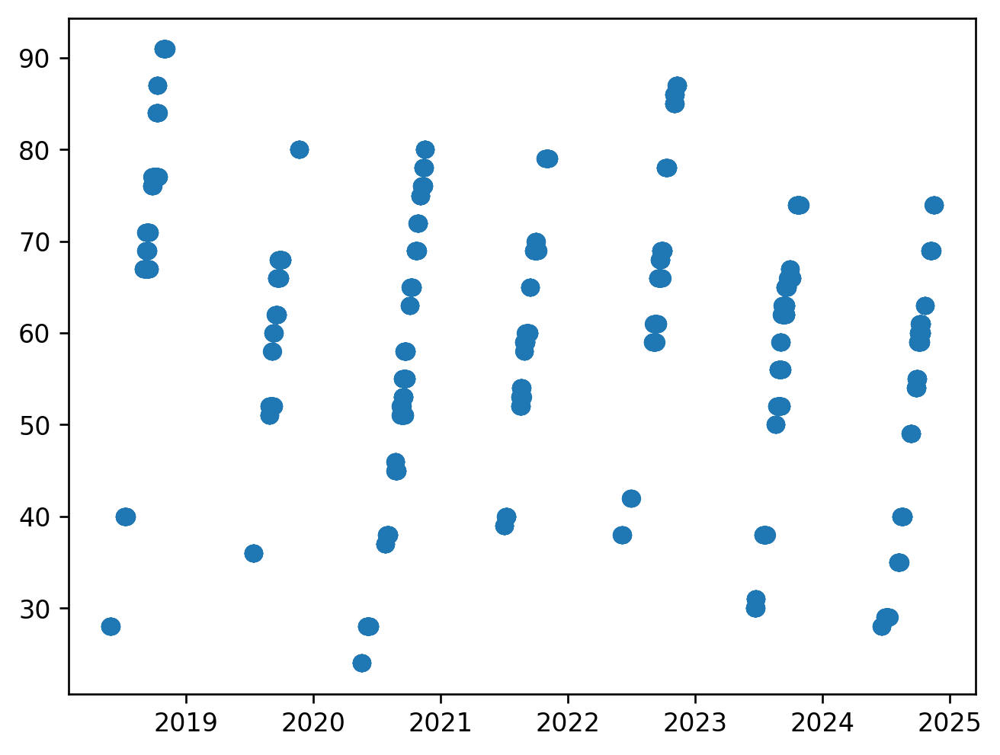

In [37]:
plt.scatter(paired_points['time'], paired_points['model_stormid'])

In [38]:
paired_points['intensrate_error'] = paired_points['era5_maxintense'] - paired_points['ibtracs_maxintense']

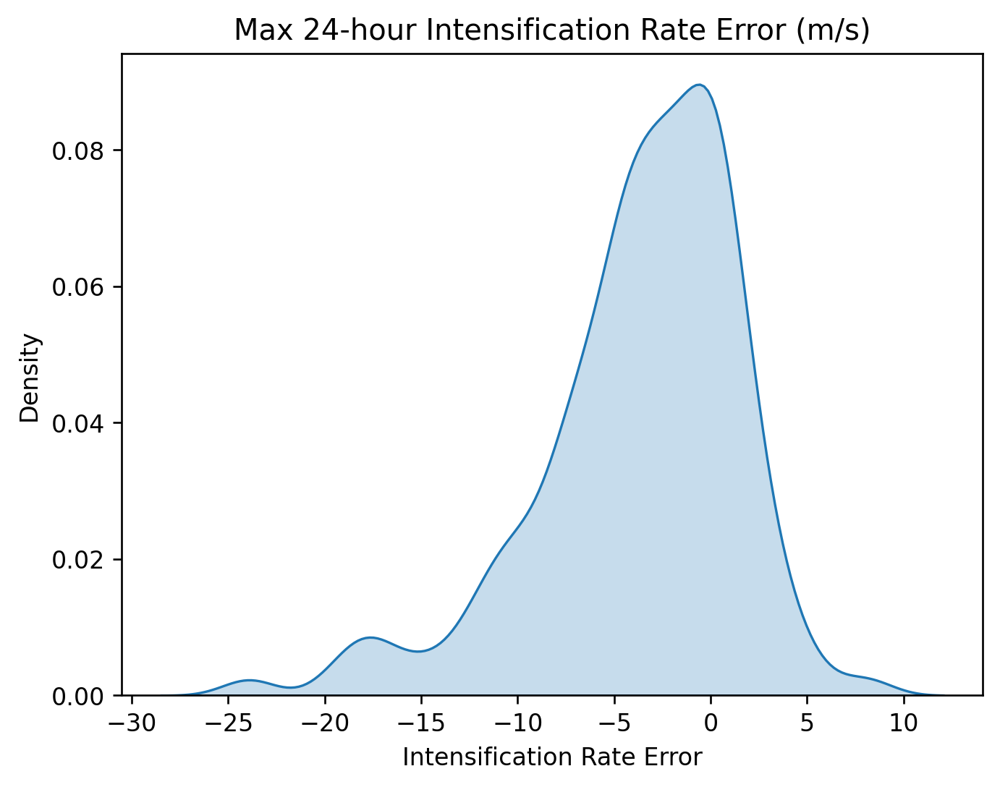

In [39]:
import seaborn as sns
import matplotlib.pyplot as plt

# Extract the variable as a 1D NumPy array, dropping NaNs
errors = paired_points['intensrate_error'].values
errors = errors[~np.isnan(errors)]

# Plot KDE
sns.kdeplot(errors, fill=True)
plt.xlabel('Intensification Rate Error')
plt.ylabel('Density')
plt.title('Max 24-hour Intensification Rate Error (m/s)')
plt.show()


In [40]:
plt.scatter(paired_points['time'],  paired_points['intens_max_24h_window_TRY'])

KeyError: "No variable named 'intens_max_24h_window_TRY'. Variables on the dataset include ['model_lat', 'model_lon', 'ibtracs_lat', 'ibtracs_lon', 'model_stormid', ..., 'slp_error', 'on_land', 'era5_maxintense', 'ibtracs_maxintense', 'intensrate_error']"

/tmp/ipykernel_182155/2343759362.py:42: UserWarning: 

The `vertical` parameter is deprecated; assigning data to `y`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(y, ax=ax_ypdf,fill=True, vertical=True)


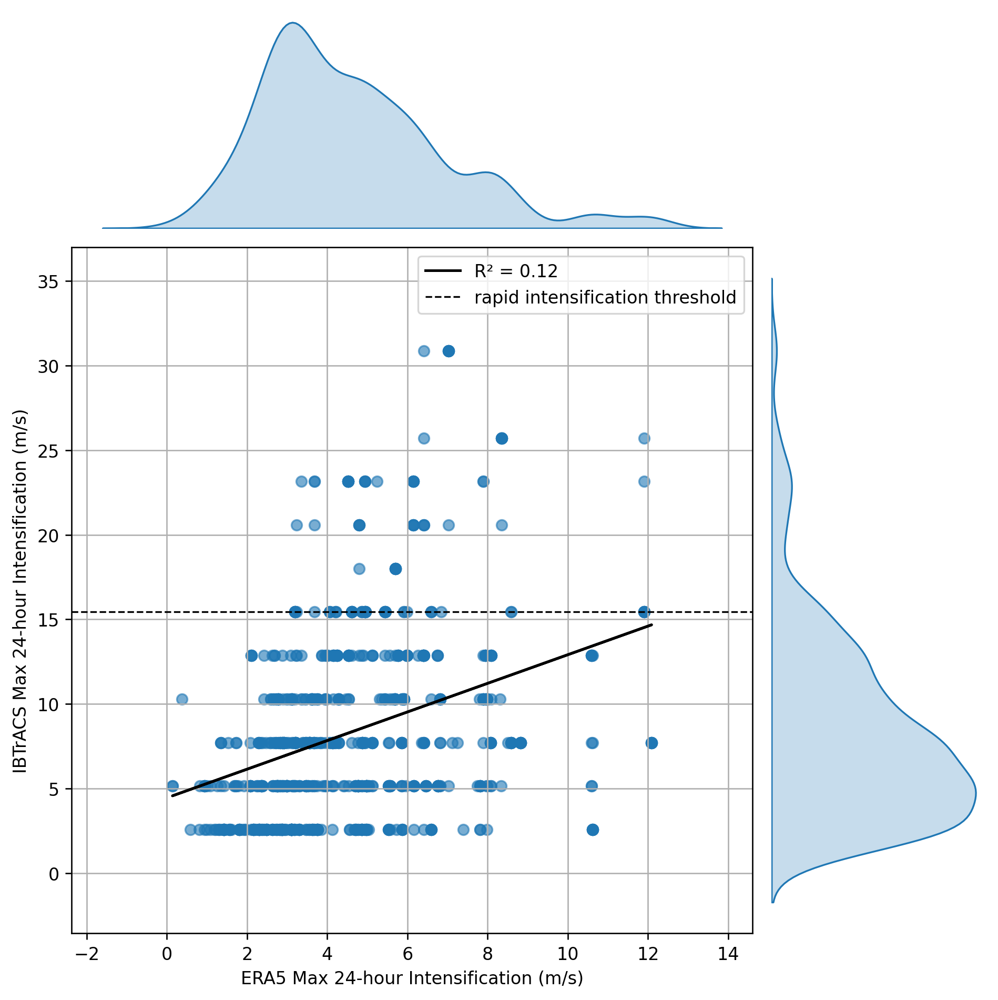

In [41]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from matplotlib.gridspec import GridSpec

# Extract variables and remove NaNs
x = paired_points['era5_maxintense'].values
y = paired_points['ibtracs_maxintense'].values
mask = ~np.isnan(x) & ~np.isnan(y)
x = x[mask]
y = y[mask]

# Linear regression
x_reshaped = x.reshape(-1, 1)
model = LinearRegression()
model.fit(x_reshaped, y)
y_pred = model.predict(x_reshaped)
r2 = r2_score(y, y_pred)

# Set up figure with gridspec (scatter + marginal PDFs)
fig = plt.figure(figsize=(8, 8))
gs = GridSpec(4, 4)
ax_main = fig.add_subplot(gs[1:4, 0:3])
ax_xpdf = fig.add_subplot(gs[0, 0:3], sharex=ax_main)
ax_ypdf = fig.add_subplot(gs[1:4, 3], sharey=ax_main)

# Main scatter plot
ax_main.scatter(x, y, alpha=0.6)
ax_main.plot(x, y_pred, color='black', label=f'R² = {r2:.2f}')
ax_main.set_xlabel('ERA5 Max 24-hour Intensification (m/s)')
ax_main.set_ylabel('IBTrACS Max 24-hour Intensification (m/s)')

ax_main.grid(True)

# Top PDF
sns.kdeplot(x, ax=ax_xpdf, fill=True)
ax_xpdf.axis('off')

# Right PDF
sns.kdeplot(y, ax=ax_ypdf,fill=True, vertical=True)
ax_ypdf.axis('off')
ax_main.axhline(15.433, color='black', linestyle='--', linewidth=1, label='rapid intensification threshold')
ax_main.legend()
plt.tight_layout()
plt.show()


### Correcting wind intensity

/tmp/ipykernel_182155/4015970896.py:46: UserWarning: 

The `vertical` parameter is deprecated; assigning data to `y`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(y, ax=ax_ypdf,fill=True, vertical=True)


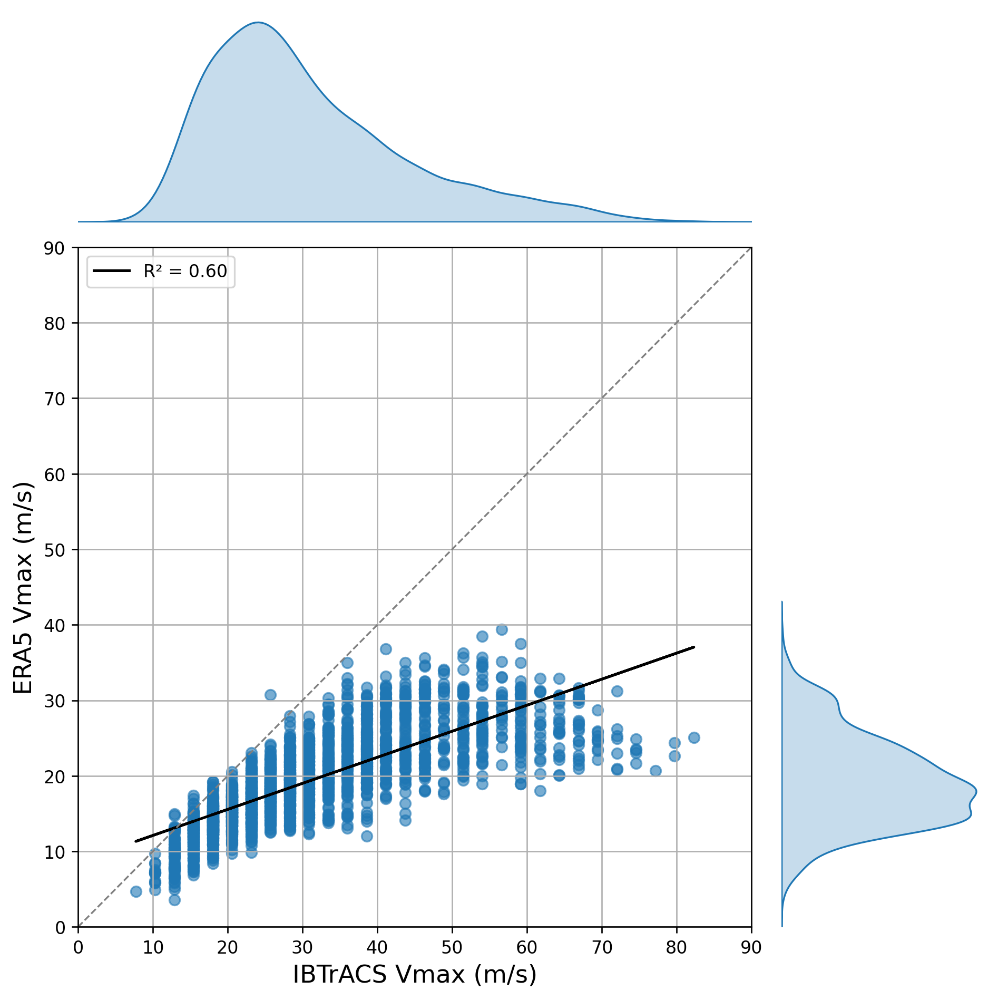

In [59]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from matplotlib.gridspec import GridSpec

# Extract variables and remove NaNs
y = paired_points['model_vmax'].values
x = paired_points['ibtracs_vmax'].values
mask = ~np.isnan(x) & ~np.isnan(y)
x = x[mask]
y = y[mask]

#x = np.log(x)
#y = np.log(y)

# Linear regression
x_reshaped = x.reshape(-1, 1)
model = LinearRegression()
model.fit(x_reshaped, y)
y_pred = model.predict(x_reshaped)
r2 = r2_score(y, y_pred)

# Set up figure with gridspec (scatter + marginal PDFs)
fig = plt.figure(figsize=(8, 8))
gs = GridSpec(4, 4)
ax_main = fig.add_subplot(gs[1:4, 0:3])
ax_xpdf = fig.add_subplot(gs[0, 0:3], sharex=ax_main)
ax_ypdf = fig.add_subplot(gs[1:4, 3], sharey=ax_main)

# Main scatter plot
ax_main.scatter(x, y, alpha=0.6)
ax_main.plot(x, y_pred, color='black', label=f'R² = {r2:.2f}')
ax_main.set_ylabel('ERA5 Vmax (m/s)', fontsize=14)
ax_main.set_xlabel('IBTrACS Vmax (m/s)', fontsize=14)
ax_main.set_xlim(0, 90)
ax_main.set_ylim(0, 90)
ax_main.grid(True)
ax_main.plot([0, 100], [0, 100], color='gray', linestyle='--', linewidth=1)
# Top PDF
sns.kdeplot(x, ax=ax_xpdf, fill=True)
ax_xpdf.axis('off')

# Right PDF
sns.kdeplot(y, ax=ax_ypdf,fill=True, vertical=True)
ax_ypdf.axis('off')
ax_main.legend()
plt.tight_layout()
plt.show()


Does not look linear! Try log log transformation

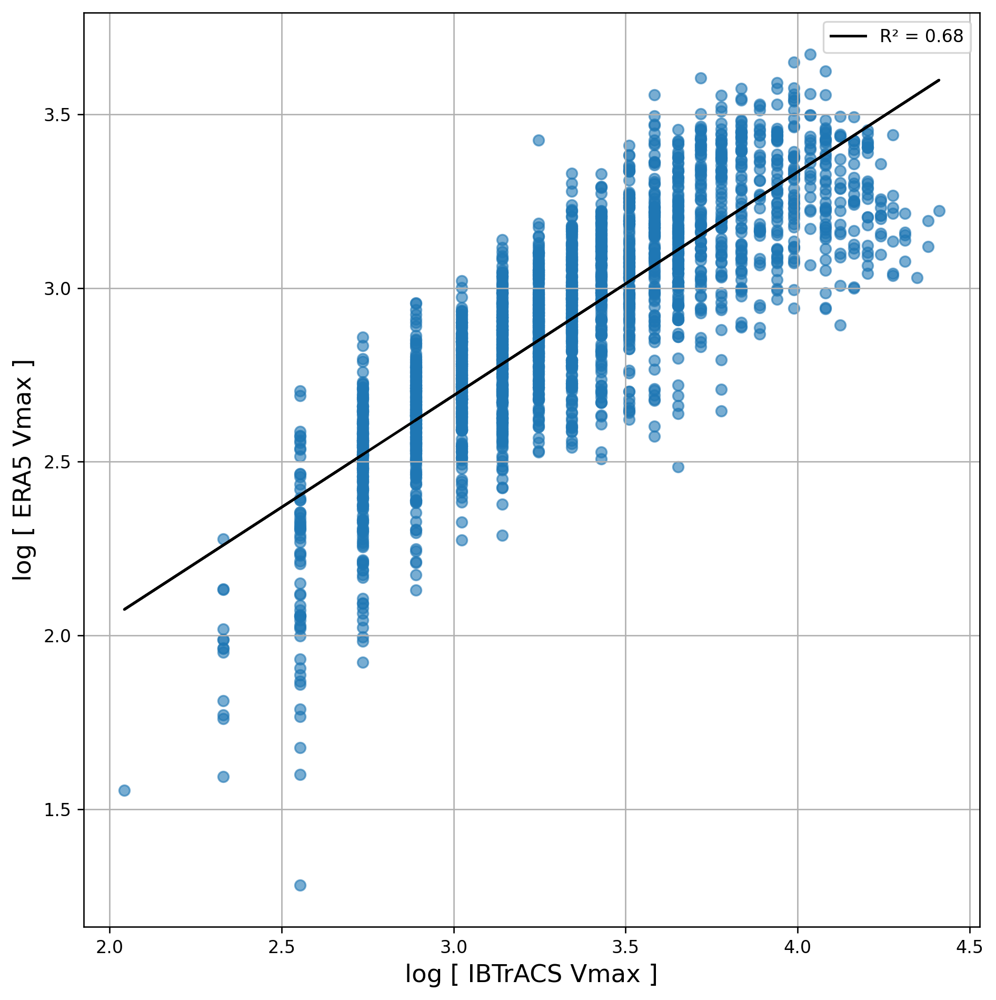

In [60]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score

# Extract variables and remove NaNs
y = paired_points['model_vmax'].values
x = paired_points['ibtracs_vmax'].values
mask = ~np.isnan(x) & ~np.isnan(y) & (x > 0) & (y > 0)
x = x[mask]
y = y[mask]

# Log-transform
x = np.log(x)
y = np.log(y)

# Linear regression
x_reshaped = x.reshape(-1, 1)
model = LinearRegression()
model.fit(x_reshaped, y)
y_pred = model.predict(x_reshaped)
r2 = r2_score(y, y_pred)

# Set up figure
fig, ax_main = plt.subplots(figsize=(8, 8))

# Main scatter plot
ax_main.scatter(x, y, alpha=0.6)
ax_main.plot(x, y_pred, color='black', label=f'R² = {r2:.2f}')
ax_main.set_ylabel('log [ ERA5 Vmax ]', fontsize=14)
ax_main.set_xlabel('log [ IBTrACS Vmax ]', fontsize=14)
ax_main.grid(True)
ax_main.legend()

plt.tight_layout()
plt.show()


In [61]:
paired_points

<xarray.Dataset> Size: 338kB
Dimensions:             (time: 2349)
Coordinates:
  * time                (time) datetime64[ns] 19kB 2018-05-26T18:00:00 ... 20...
    on_land             (time) int64 19kB 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 1
Data variables: (12/19)
    model_lat           (time) float64 19kB 23.5 24.0 25.25 ... 16.5 17.0 17.75
    model_lon           (time) float64 19kB 276.0 274.8 276.5 ... 272.2 271.5
    ibtracs_lat         (time) float32 9kB 22.6 23.6 24.9 ... 16.5 16.8 17.4
    ibtracs_lon         (time) float32 9kB 274.7 275.2 275.7 ... 272.1 270.9
    model_stormid       (time) int64 19kB 28 28 28 28 28 28 ... 74 74 74 74 74
    ibtracs_stormid     (time) float32 9kB 25.0 25.0 25.0 ... 87.0 87.0 87.0
    ...                  ...
    vtrans_error        (time) float64 19kB nan 0.2544 2.184 ... -1.776 -0.8363
    vmax_error          (time) float64 19kB -1.985 -6.096 1.234 ... -5.68 -2.069
    slp_error           (time) float64 19kB 214.8 225.1 203.3 ... 256.9 332.2
    era5_maxintense     (time) float64 19kB 2.954 3.116 3.116 ... 1.531 1.531
    ibtracs_maxintense  (time) float64 19kB 2.572 5.144 10.29 ... nan nan nan
    intensrate_error    (time) float64 19kB 0.3817 -2.029 -7.173 ... nan nan nan